# Advanced Lane Detection

## Pipeline of this project:

1) Compute the camera caliberation matrix and distortion coefficient from chessboard images. <br/>
2) Apply distortion correction to raw images. <br/>
3) Use color gradient to create binary threshholded image. <br/>
4) Apply perspective transform to binary threshholded image to get top view. <br/>
5) Detect pixel lane and fit to find lane boundary. <br/>
6) Determine lane curvature and vehicle position wrt centre. <br/>
7) Warp the detected boundaries back to original image. <br/>

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob
import os
import time

%matplotlib inline
%reload_ext autoreload
%autoreload 2

from moviepy.editor import VideoFileClip
from IPython.display import HTML

# Camera Calibration

In [2]:
calibration_images = "camera_cal"

In [3]:
calibration_files = os.listdir(calibration_images)
assert(len(calibration_files) > 0)

In [4]:
def create_dir(dir_name):
    if not os.path.exists(dir_name):
        os.makedirs(dir_name)

In [5]:
# Create directory to save output directory
output_images = "output_images/"
create_dir(output_images)

As can be seen in above images there are 9 corners in rows and 6 corners in columns. Lets go ahead and find corners.<br/>
There are 3 images for which corners = 9 * 6 doesn't work. But 17 images are enough for caliberation

Failed for images: [
['calibration5.jpg', 'calibration4.jpg', 'calibration1.jpg']
]


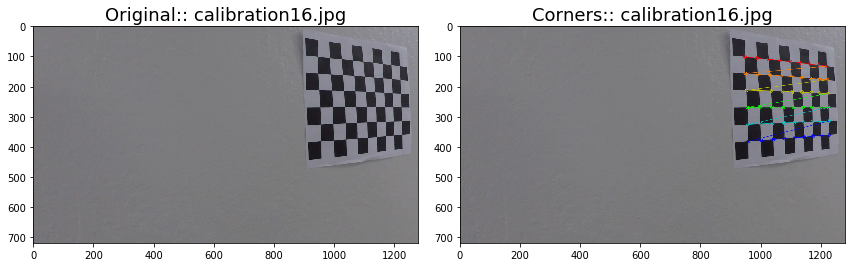

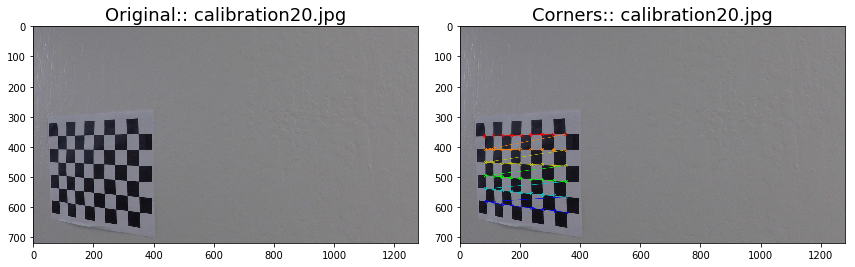

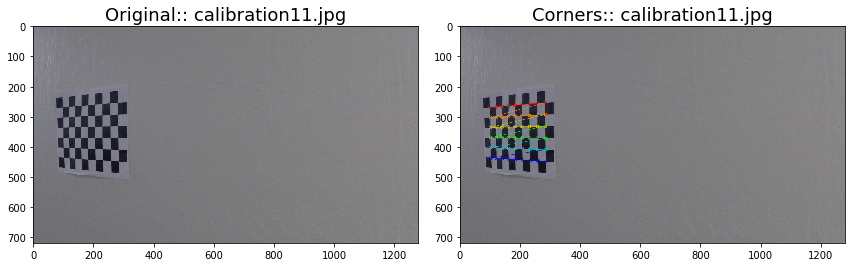

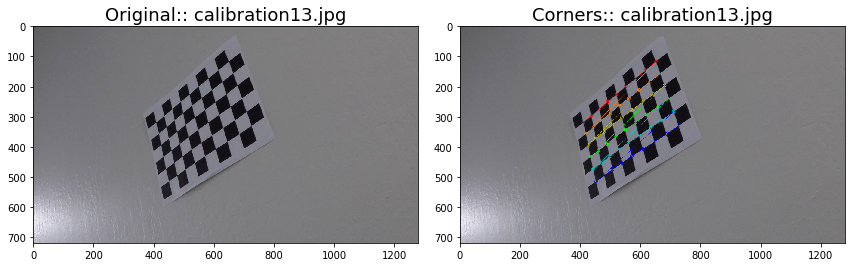

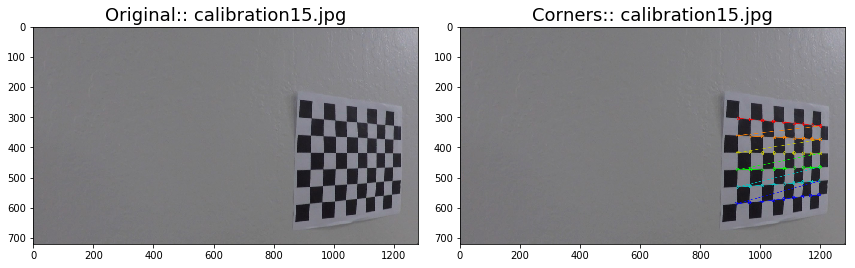

...

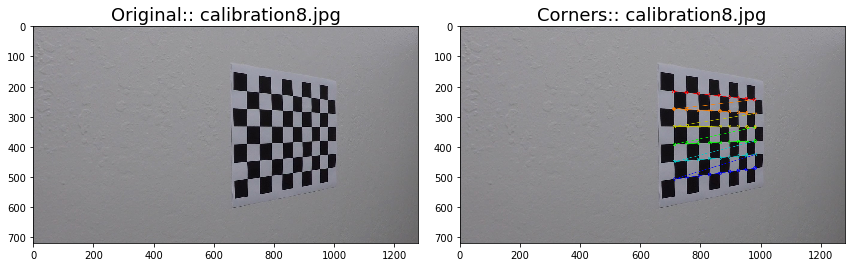

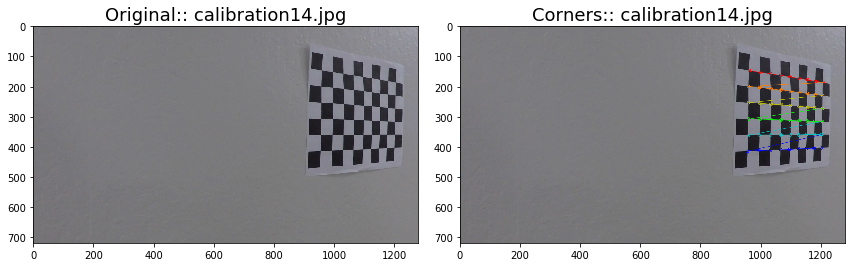

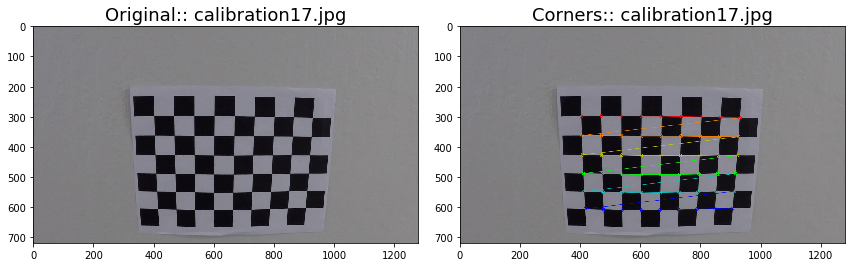

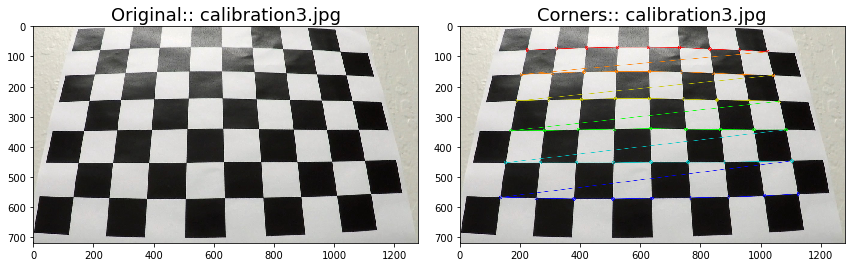

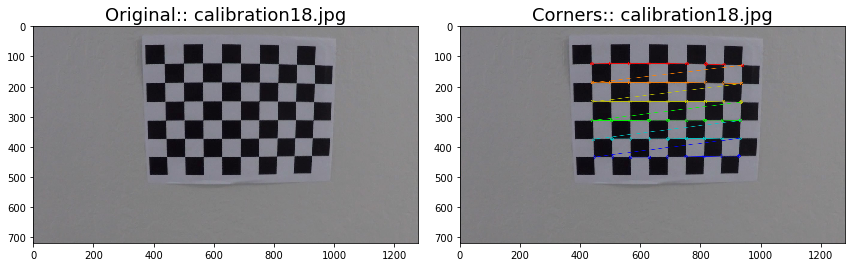

In [6]:
nx = 9
ny = 6

objp = np.zeros((ny * nx, 3), np.float32)
objp[:,:2] = np.mgrid[:nx, :ny].T.reshape(-1, 2)

objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

failed =[]

for idx, name in enumerate(calibration_files):
    img = cv2.imread(calibration_images + "/"+ name)
    
    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
    
    if ret == True:
        objpoints.append(objp)
        corners = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners)
        
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
        f.tight_layout()
        ax1.imshow(cv2.cvtColor(cv2.imread(calibration_images + "/"+ name), cv2.COLOR_BGR2RGB))
        ax1.set_title("Original:: " + name, fontsize=18)
        ax2.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
        ax2.set_title("Corners:: "+ name, fontsize=18)
        f.savefig(output_images + "/output" + str(time.time()) + "_corners.jpg")
        
    else:
        failed.append(name)
        
print("Failed for images: [")
print(failed)
print("]")

# Distortion correction

Using the object and image points to calibrate the camera and compute the camera matrix and distortion coefficients

In [7]:
def undistort(img_name, objpoints, imgpoints):
    img = cv2.imread(img_name)
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1:], None, None)
    undist= cv2.undistort(img, mtx, dist, None, mtx)
    return undist

In [8]:
def undistort_no_read(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1:], None, None)
    undist= cv2.undistort(img, mtx, dist, None, mtx)
    return undist

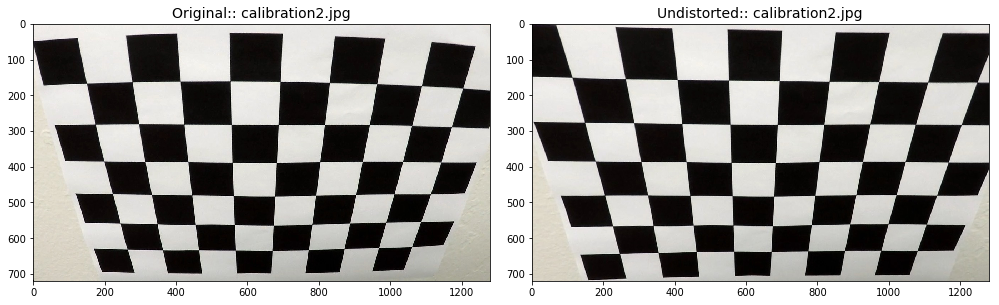

In [9]:
undist = undistort(calibration_images + "/calibration2.jpg", objpoints, imgpoints)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14,10))
f.tight_layout()
ax1.imshow(cv2.cvtColor(cv2.imread(calibration_images + "/calibration2.jpg"), cv2.COLOR_BGR2RGB))
ax1.set_title("Original:: calibration2.jpg" , fontsize=14)
ax2.imshow(cv2.cvtColor(undist,cv2.COLOR_BGR2RGB))
ax2.set_title("Undistorted:: calibration2.jpg", fontsize=14)
f.savefig(output_images + "/output_" + str(time.time()) + "_undist.jpg")

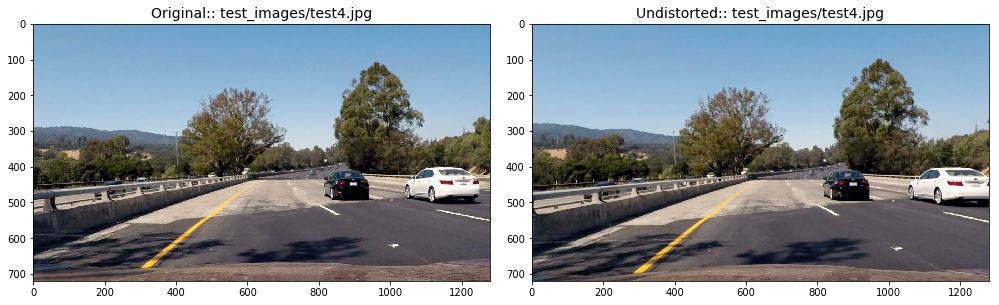

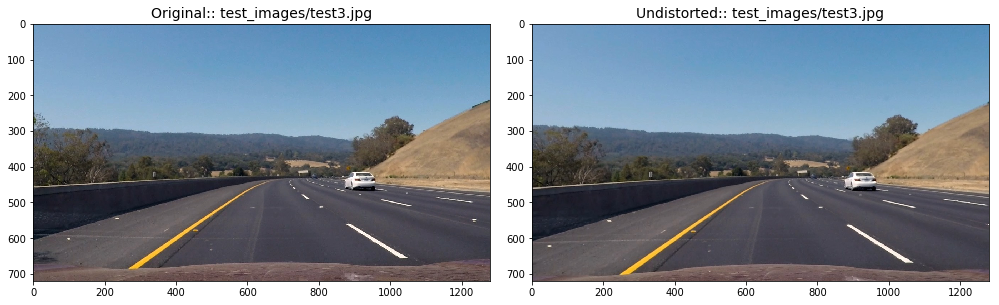

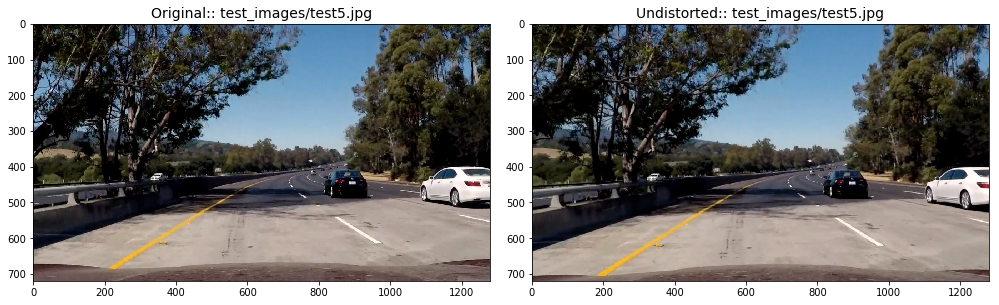

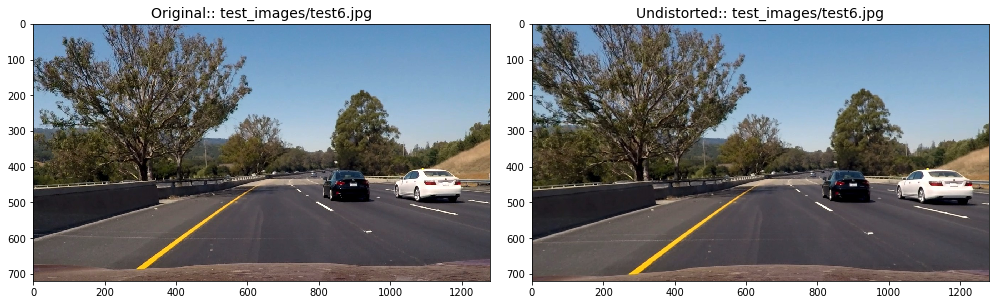

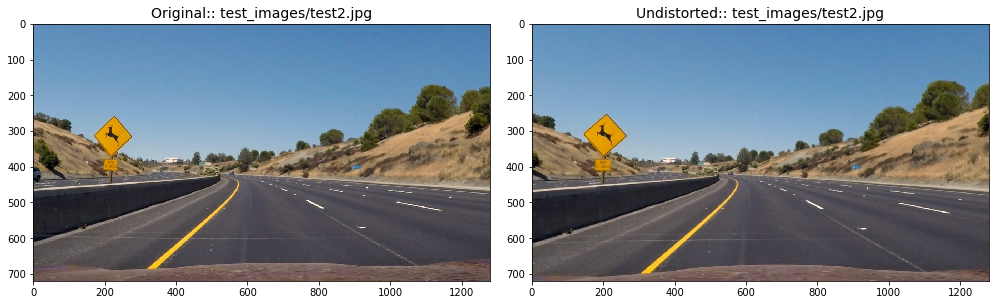

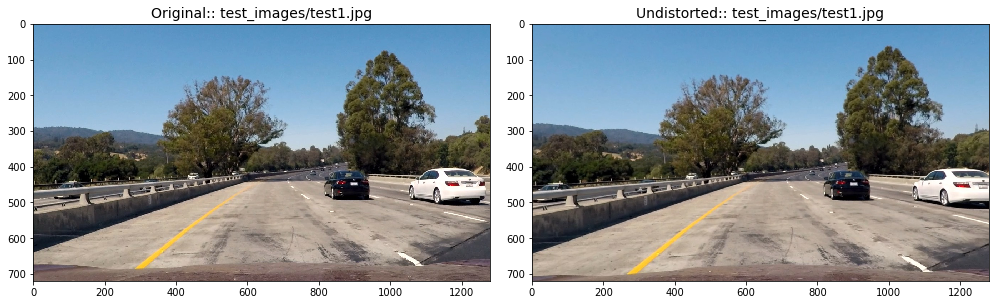

In [10]:
images = glob.glob('test_images/test*.jpg')
for image in images:
    dst = undistort(image, objpoints, imgpoints)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(14,10))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2RGB))
    ax1.set_title("Original:: " + image , fontsize=14)
    ax2.imshow(cv2.cvtColor(dst, cv2.COLOR_BGR2RGB))
    ax2.set_title("Undistorted:: "+ image, fontsize=14)
    f.savefig(output_images + "/output_" + str(time.time()) + "_test.jpg")

# Gradient and color transform


Using Sobel we can take the gradient in x or y and set thresholds to identify pixels within a certain gradient range. <br/>
In order to get color transformed binary threshold image I use color space HLS.
Then, I used a combination of color and gradient thresholds to generate a binary image.<br/>

In [11]:
def abs_thresh(img, sobel_kernel=3, mag_thresh=(0,255), return_grad= False, direction ='x'):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    grad = None
    scaled_sobel = None
    
    if direction.lower() == 'x':
        grad = cv2.Sobel(gray, cv2.CV_64F, 1, 0,ksize=sobel_kernel) # Take the gradient in x direction     
    else:
        grad = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel) # Take the gradient in y direction
        
    if return_grad == True:
        return grad

    # Absolute x derivative to accentuate lines away from horizontal
    abs_sobel = np.absolute(grad)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))

    grad_binary = np.zeros_like(scaled_sobel)
    grad_binary[(scaled_sobel >= mag_thresh[0]) & (scaled_sobel < mag_thresh[1])] = 1
    
    return grad_binary

Text(0.5,1,'Transformed:: test_images/test1.jpg')

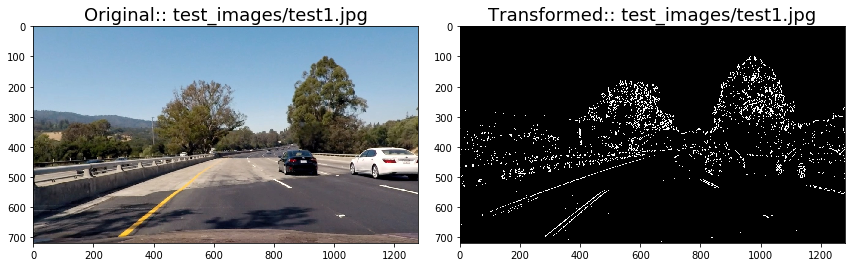

In [12]:
img = undistort(images[0], objpoints, imgpoints)
    
combined_binary = abs_thresh(img, sobel_kernel=3, mag_thresh=(30, 100), direction='x')
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title("Original:: " + image , fontsize=18)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title("Transformed:: "+ image, fontsize=18)

Text(0.5,1,'Transformed:: test_images/test1.jpg')

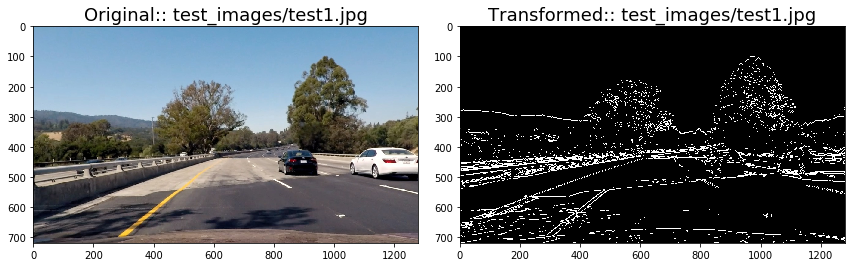

In [13]:
img = undistort(images[0], objpoints, imgpoints)
    
combined_binary = abs_thresh(img, sobel_kernel=3, mag_thresh=(30, 120), direction='y')
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title("Original:: " + image , fontsize=18)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title("Transformed:: "+ image, fontsize=18)

In [14]:
def mag_threshold(img, sobel_kernel=3, mag_thresh=(0, 255)):    
    xgrad =  abs_thresh(img, sobel_kernel=sobel_kernel, mag_thresh=mag_thresh, return_grad=True)
    ygrad =  abs_thresh(img, sobel_kernel=sobel_kernel, mag_thresh=mag_thresh, return_grad=True, direction='y')
    
    magnitude = np.sqrt(np.square(xgrad)+np.square(ygrad))
    abs_magnitude = np.absolute(magnitude)
    scaled_magnitude = np.uint8(255*abs_magnitude/np.max(abs_magnitude))
    mag_binary = np.zeros_like(scaled_magnitude)
    mag_binary[(scaled_magnitude >= mag_thresh[0]) & (scaled_magnitude < mag_thresh[1])] = 1
    
    return mag_binary

Text(0.5,1,'Transformed:: test_images/test1.jpg')

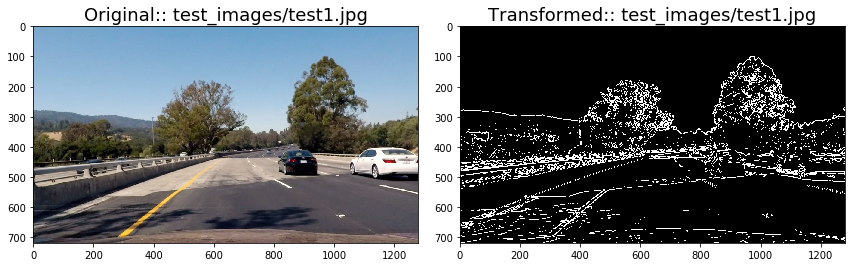

In [15]:
img = undistort(images[0], objpoints, imgpoints)
    
combined_binary = mag_threshold(img, mag_thresh=(30, 100))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title("Original:: " + image , fontsize=18)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title("Transformed:: "+ image, fontsize=18)

In [16]:
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    xgrad =  cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    ygrad =  cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    xabs = np.absolute(xgrad)
    yabs = np.absolute(ygrad)
    
    grad_dir = np.arctan2(yabs, xabs)
    
    binary_output = np.zeros_like(grad_dir).astype(np.uint8)
    binary_output[(grad_dir >= thresh[0]) & (grad_dir < thresh[1])] = 1
    return binary_output

In [17]:
def rgb_thresh_img(img, channel='R', thresh=(0, 255)):
    img1 = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if channel == 'R':
        bin_img = img1[:, :, 0]
    if channel == 'G' :
        bin_img = img1[:, :, 1]
    if channel == 'B' :
        bin_img = img1[:, :, 2]
        
    binary_img = np.zeros_like(bin_img).astype(np.uint8) 
    binary_img[(bin_img >= thresh[0]) & (bin_img < thresh[1])] = 1
    
    return binary_img

Text(0.5,1,'Transformed:: test_images/test1.jpg')

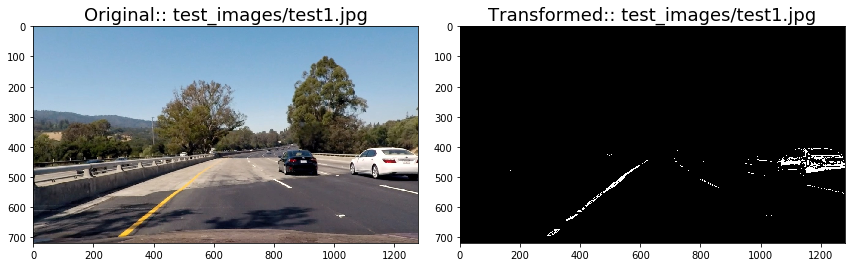

In [18]:
img = undistort(images[0], objpoints, imgpoints)
    
combined_binary = rgb_thresh_img(img, thresh=(230, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title("Original:: " + image , fontsize=18)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title("Transformed:: "+ image, fontsize=18)

Text(0.5,1,'Transformed:: test_images/test1.jpg')

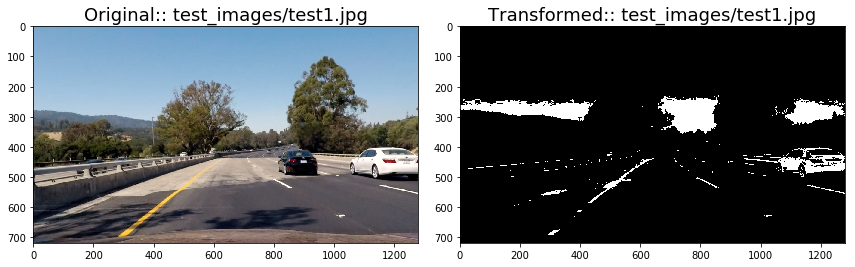

In [19]:
img = undistort(images[0], objpoints, imgpoints) 
combined_binary = rgb_thresh_img(img, thresh=(200, 255), channel='G')
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title("Original:: " + image , fontsize=18)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title("Transformed:: "+ image, fontsize=18)

Text(0.5,1,'Transformed:: test_images/test1.jpg')

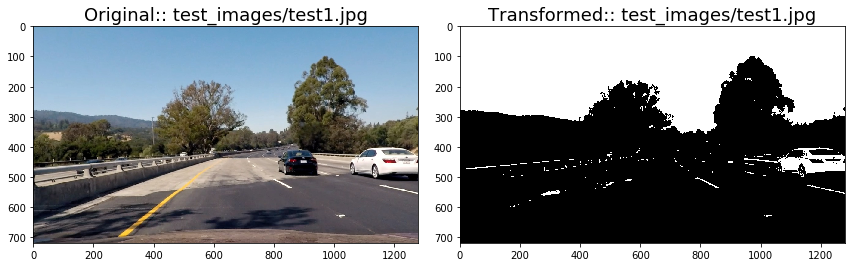

In [20]:
img = undistort(images[0], objpoints, imgpoints)
    
combined_binary = rgb_thresh_img(img, thresh=(185, 255), channel='B')
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title("Original:: " + image , fontsize=18)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title("Transformed:: "+ image, fontsize=18)

In [21]:
def hls_lthresh_img(img, thresh=(0, 255)):
    hls_img= cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    L = hls_img[:, :, 1]

    binary_output = np.zeros_like(L).astype(np.uint8)    
    binary_output[(L >= thresh[0]) & (L < thresh[1])] = 1
    
    return binary_output

Text(0.5,1,'Transformed:: test_images/test1.jpg')

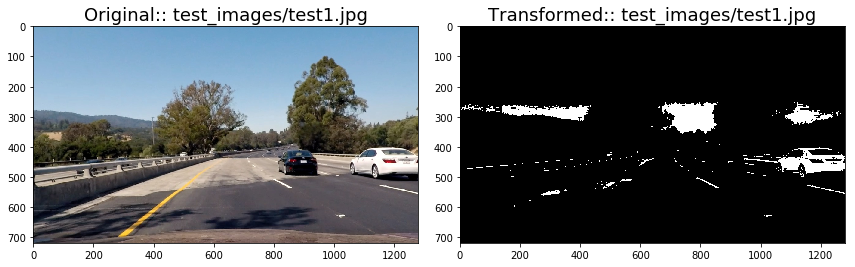

In [22]:
img = undistort(images[0], objpoints, imgpoints)
    
combined_binary = hls_lthresh_img(img, thresh=(201, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title("Original:: " + image , fontsize=18)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title("Transformed:: "+ image, fontsize=18)

In [23]:
def hls_sthresh_img(img, thresh=(0, 255)):
    hls_img= cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    S = hls_img[:, :, 2]

    binary_output = np.zeros_like(S).astype(np.uint8)    
    binary_output[(S >= thresh[0]) & (S < thresh[1])] = 1
    
    return binary_output

Text(0.5,1,'Transformed:: test_images/test1.jpg')

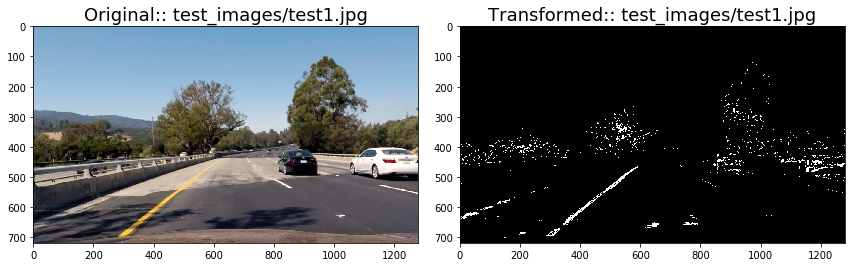

In [24]:
img = undistort(images[0], objpoints, imgpoints)
    
combined_binary = hls_sthresh_img(img, thresh=(150, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title("Original:: " + image , fontsize=18)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title("Transformed:: "+ image, fontsize=18)

In [25]:
def lab_athresh_img(img, thresh=(0,255)):
    lab_img = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    A = lab_img[:, :, 1]
    
    bin_op = np.zeros_like(A).astype(np.uint8)
    bin_op[(A >= thresh[0]) & (A < thresh[1])] = 1
    
    return bin_op

In [26]:
def lab_bthresh_img(img, thresh=(0,255)):
    lab_img = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    B = lab_img[:, :, 2]
    
    bin_op = np.zeros_like(B).astype(np.uint8)
    bin_op[(B >= thresh[0]) & (B < thresh[1])] = 1
    
    return bin_op

Text(0.5,1,'Transformed:: test_images/test1.jpg')

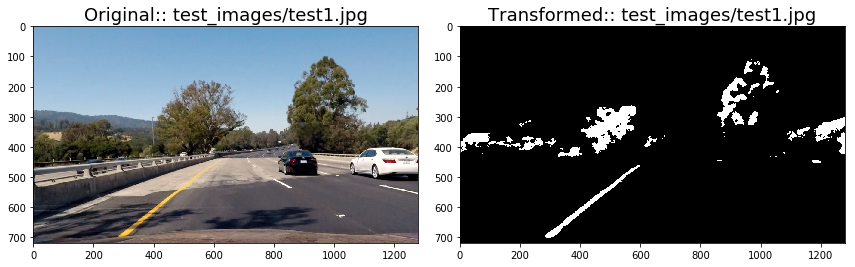

In [27]:
img = undistort(images[0], objpoints, imgpoints)
    
combined_binary = lab_bthresh_img(img, thresh=(147, 255))
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
f.tight_layout()
ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
ax1.set_title("Original:: " + image , fontsize=18)
ax2.imshow(combined_binary, cmap='gray')
ax2.set_title("Transformed:: "+ image, fontsize=18)

In [28]:
def get_bin_img(img, kernel_size=3, sobel_dirn='X', sobel_thresh=(0,255), r_thresh=(0, 255), 
                s_thresh=(0,255), b_thresh=(0, 255), g_thresh=(0, 255)):
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS).astype(np.float32)
    h_channel = hls[:,:,0]
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
      
    if sobel_dirn == 'X':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize = kernel_size)
    else:
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize = kernel_size)
        
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= sobel_thresh[0]) & (scaled_sobel <= sobel_thresh[1])] = 1
    
    combined = np.zeros_like(sbinary)
    combined[(sbinary == 1)] = 1

    # Threshold R color channel
    r_binary = rgb_thresh_img(img, thresh= r_thresh)
    
    # Threshhold G color channel
    g_binary = rgb_thresh_img(img, thresh= g_thresh, channel='G')
    
    # Threshhold B in LAB
    b_binary = lab_bthresh_img(img, thresh=b_thresh)
    
    # Threshold color channel
    s_binary = hls_sthresh_img(img, thresh=s_thresh)

    # If two of the three are activated, activate in the binary image
    combined_binary = np.zeros_like(combined)
    combined_binary[(r_binary == 1) | (combined == 1) | (s_binary == 1)| (b_binary == 1) | (g_binary == 1)] = 1

    return combined_binary

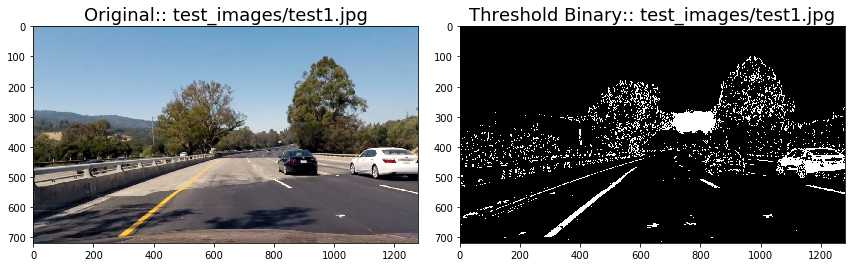

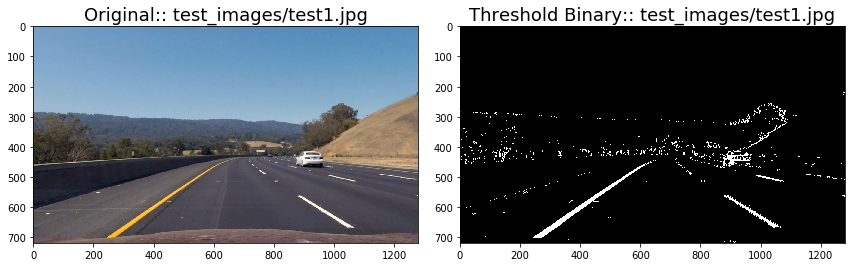

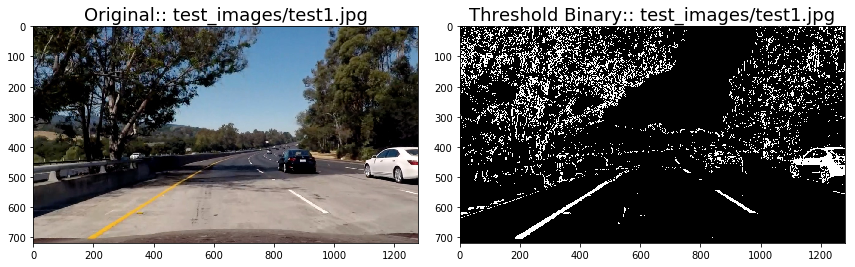

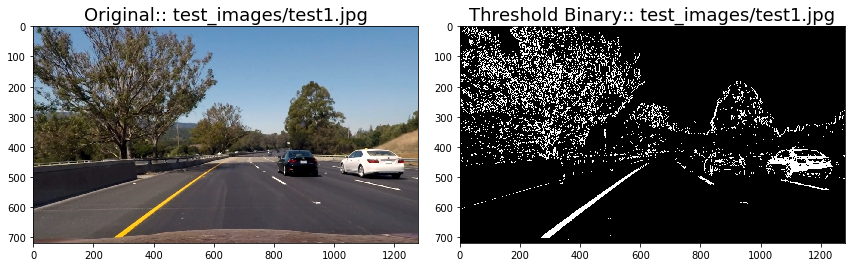

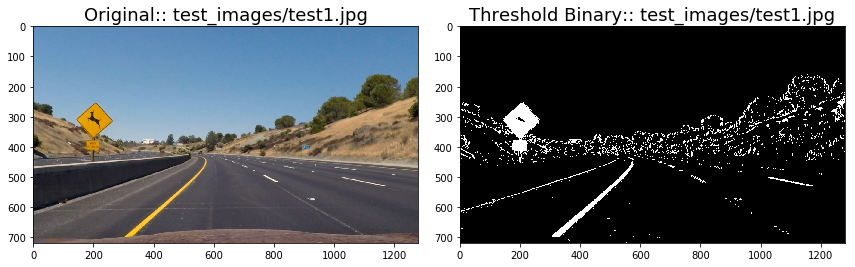

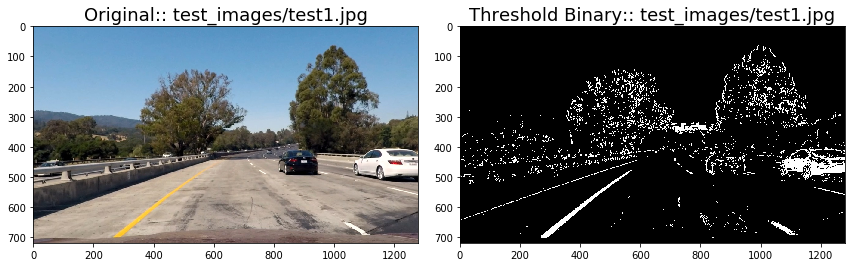

In [29]:
# Testing the threshholding
kernel_size = 5
mag_thresh = (30, 100)
r_thresh = (235, 255)
s_thresh = (165, 255)
b_thresh = (160, 255)
g_thresh = (210, 255)

for image_name in images:
    img = undistort(image_name, objpoints, imgpoints)
    
    combined_binary = get_bin_img(img, kernel_size=kernel_size, sobel_thresh=mag_thresh, r_thresh=r_thresh, 
                                  s_thresh=s_thresh, b_thresh = b_thresh, g_thresh=g_thresh)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title("Original:: " + image , fontsize=18)
    ax2.imshow(combined_binary, cmap='gray')
    ax2.set_title("Threshold Binary:: "+ image, fontsize=18)
    f.savefig(output_images + "/output_" + str(time.time()) + "_binary.jpg")

# Perspective Transform

Perspective transform maps the points in given image to different perspective. In lane lines finding we are here looking for bird's eye view of the road <br/>
This will be helpful in finding lane curvature.

In [30]:
def transform_image(img, offset=250, src=None, dst=None):    
    img_size = (img.shape[1], img.shape[0])
    
    out_img_orig = np.copy(img)
    
    lefttop  = (585, 460)
    righttop = (705, 460)
    leftbottom  = (210, img.shape[0])
    rightbottom = (1080, img.shape[0])
    
    warped_lefttop = (offset,0)
    warped_righttop = (offset, img.shape[0])
    warped_leftbottom = (img.shape[1] - offset, 0)
    warped_rightbottom = (img.shape[1] - offset, img.shape[0])
    
    color_r = [0, 0, 255]
    color_g = [0, 255, 0]
    line_width = 5
    
    if src is not None:
        src = src
    else:
        src = np.float32([lefttop, leftbottom, righttop, rightbottom])
        
    if dst is not None:
        dst = dst
    else:
        dst = np.float32([warped_lefttop, warped_righttop, warped_leftbottom, warped_rightbottom])
    
    cv2.line(out_img_orig, leftbottom, lefttop, color_r, line_width)
    cv2.line(out_img_orig, leftbottom, rightbottom, color_r , line_width * 2)
    cv2.line(out_img_orig, righttop, rightbottom, color_r, line_width)
    cv2.line(out_img_orig, righttop, lefttop, color_g, line_width)
    
    # calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    minv = cv2.getPerspectiveTransform(dst, src)
    
    # Warp the image
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.WARP_FILL_OUTLIERS+cv2.INTER_CUBIC)
    out_warped_img = np.copy(warped)
    
    cv2.line(out_warped_img, warped_righttop, warped_lefttop, color_r, line_width)
    cv2.line(out_warped_img, warped_righttop, warped_rightbottom, color_r , line_width * 2)
    cv2.line(out_warped_img, warped_leftbottom, warped_rightbottom, color_r, line_width)
    cv2.line(out_warped_img, warped_leftbottom, warped_lefttop, color_g, line_width)
    
    return warped, M, minv, out_img_orig, out_warped_img

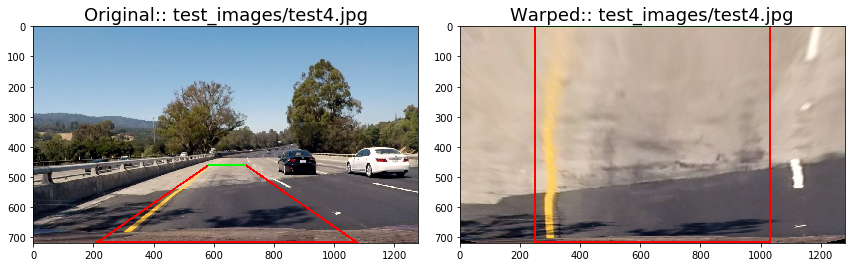

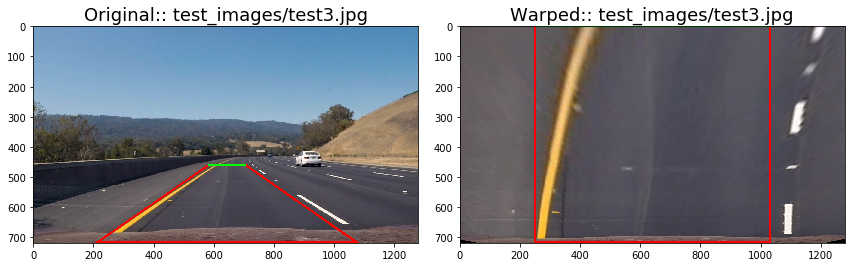

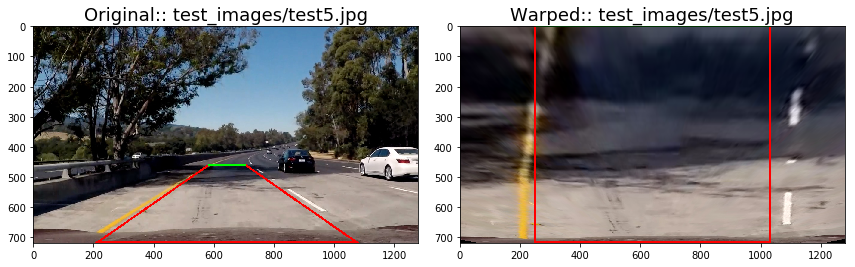

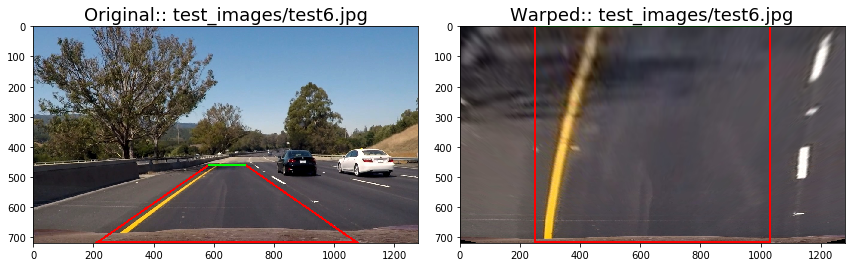

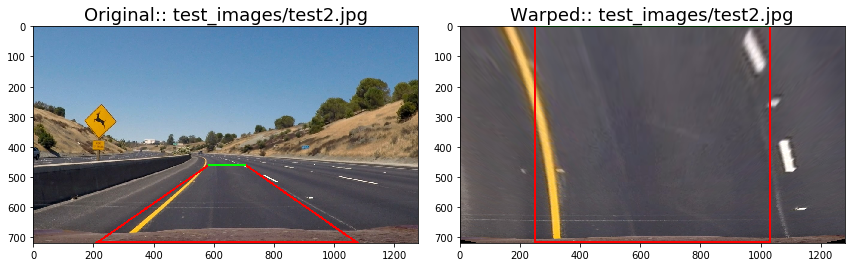

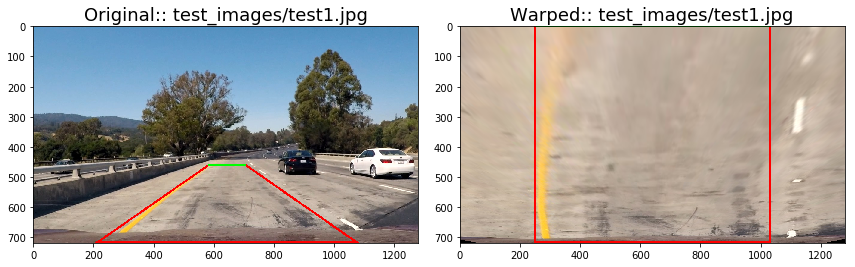

In [31]:
for image in images:
    img = cv2.imread(image)
    warped, M, minv, out_img_orig, out_warped_img = transform_image(img)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(out_img_orig, cv2.COLOR_BGR2RGB))
    ax1.set_title("Original:: " + image , fontsize=18)
    ax2.imshow(cv2.cvtColor(out_warped_img, cv2.COLOR_BGR2RGB))
    ax2.set_title("Warped:: "+ image, fontsize=18)
    f.savefig(output_images + "/output_" + str(time.time()) + "_warped.jpg")

Check perspective transform against combined binary:

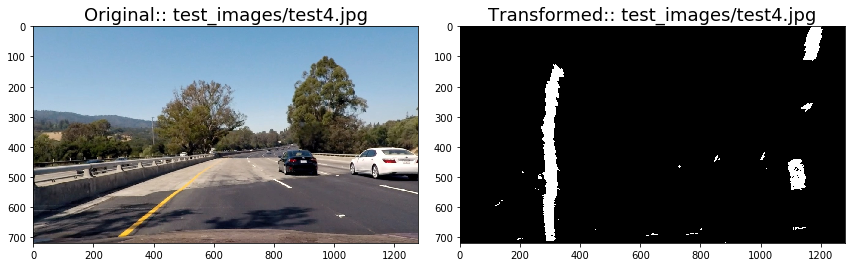

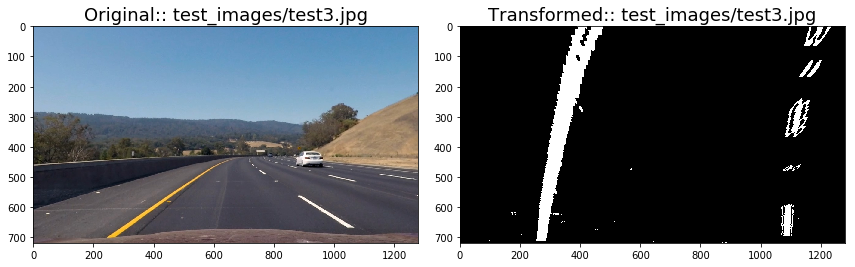

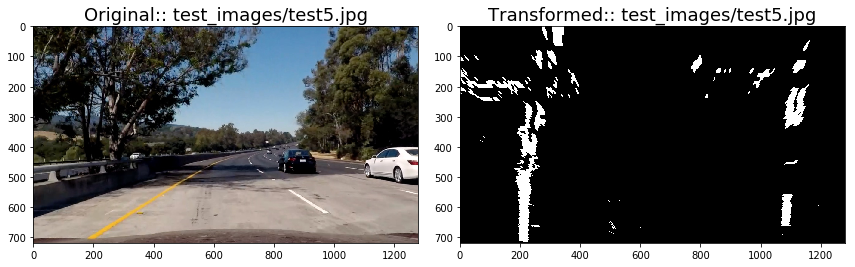

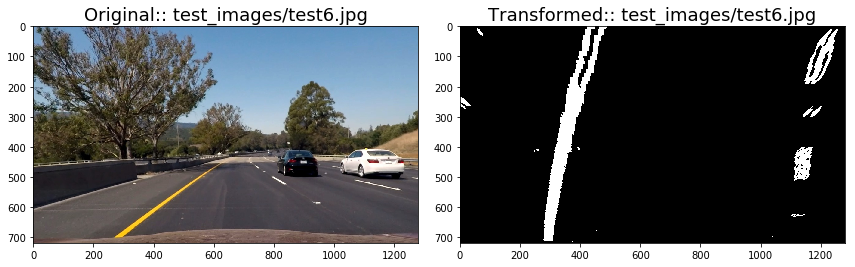

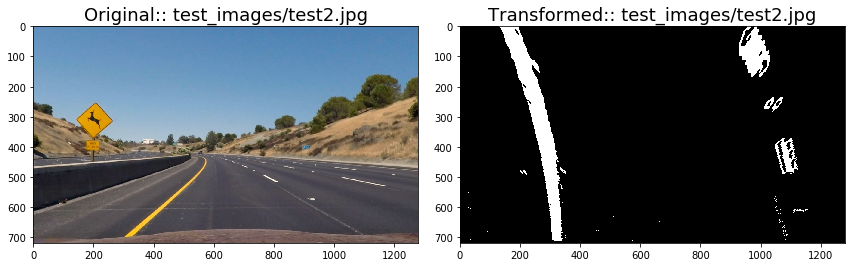

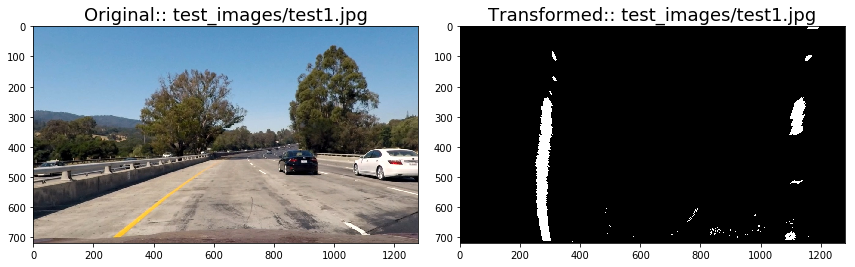

In [32]:
for image in images:
    img = undistort(image, objpoints, imgpoints)
    combined_binary = get_bin_img(img, kernel_size=kernel_size, sobel_thresh=mag_thresh, 
                                  r_thresh=r_thresh, s_thresh=s_thresh, b_thresh = b_thresh, g_thresh=g_thresh)
    warped, warp_matrix, unwarp_matrix, out_img_orig, out_warped_img = transform_image(combined_binary)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title("Original:: " + image , fontsize=18)
    ax2.imshow(warped, cmap='gray')
    ax2.set_title("Transformed:: "+ image, fontsize=18)
    f.savefig(output_images + "/output_" + str(time.time()) + "_combined_warped.jpg")

# Lane line pixel detection and polynomial fitting

Using binary image where lane lines are clearly visible, now we have to detect which pixels belong to the left line and which to the right. <br/>
Plotting a histogram of where the binary activations occur across the image is one potential solution for this. Pixel value can be either 0 or 1, we apply histogram representation in order to find edges<br/>
The 2 peaks that we might see in histogram might be good position to start to find lane pixels <br/>
The steps are:
- Split the histogram for the two lines
- Set up windows and window hyperparameters
- Iterate through nwindows to track curvature
- Fit a polynomial

In [33]:
def find_lines(warped_img, nwindows=9, margin=80, minpix=40):
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(warped_img[warped_img.shape[0]//2:,:], axis=0)
        
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((warped_img, warped_img, warped_img)) * 255
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(warped_img.shape[0]//nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = warped_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = warped_img.shape[0] - (window+1)*window_height
        win_y_high = warped_img.shape[0] - window*window_height
        
        ### Find the four below boundaries of the window ###
        win_xleft_low = leftx_current - margin  
        win_xleft_high = leftx_current + margin  
        win_xright_low =  rightx_current - margin 
        win_xright_high = rightx_current + margin  
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low), (win_xleft_high,win_y_high),(0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low), (win_xright_high,win_y_high),(0,255,0), 2) 
        
        ### Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low ) & (nonzeroy < win_y_high) &\
                            (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low ) & (nonzeroy < win_y_high) &\
                            (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, left_lane_inds, right_lane_inds, out_img

def fit_polynomial(binary_warped, nwindows=9, margin=100, minpix=50, show=True):
    # Find our lane pixels first
    leftx, lefty, rightx, righty, left_lane_inds, right_lane_inds, out_img \
        = find_lines(binary_warped, nwindows=nwindows, margin=margin, minpix=minpix)

    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    if show == True:
        plt.plot(left_fitx, ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')

    return left_fit, right_fit, left_fitx, right_fitx, left_lane_inds, right_lane_inds, out_img

# Skip the sliding windows step once you've found the lines

Once lines are found, we don't need to do blind search , but we can search around existing line with some margin. As the lanes are not going to shift much between 2 frames of video

In [34]:
def search_around_poly(binary_warped, left_fit, right_fit, ymtr_per_pixel, xmtr_per_pixel, margin=80):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                    left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                    left_fit[1]*nonzeroy + left_fit[2] + margin)))
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                    right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                    right_fit[1]*nonzeroy + right_fit[2] + margin)))
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each using `np.polyfit`
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)

    # Fit second order polynomial to for for points on real world   
    left_lane_indices = np.polyfit(lefty*ymtr_per_pixel, leftx*xmtr_per_pixel, 2)
    right_lane_indices = np.polyfit(righty*ymtr_per_pixel, rightx*xmtr_per_pixel, 2)
    
    return left_fit, right_fit, left_lane_indices, right_lane_indices

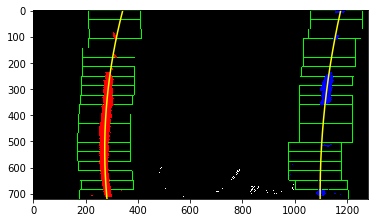

In [35]:
left_fit, right_fit, left_fitx, right_fitx, left_lane_indices, right_lane_indices, out_img = fit_polynomial(warped, nwindows=20)
plt.imshow(out_img)
plt.savefig(output_images + "/output_" + str(time.time()) + "_sliding.jpg")

# Radius of curvature

In [36]:
def radius_curvature(img, left_fit, right_fit, xmtr_per_pixel, ymtr_per_pixel):
    ploty = np.linspace(0, img.shape[0] - 1, img.shape[0])
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    y_eval = np.max(ploty)
    
    left_fit_cr = np.polyfit(ploty*ymtr_per_pixel, left_fitx*xmtr_per_pixel, 2)
    right_fit_cr = np.polyfit(ploty*ymtr_per_pixel, right_fitx*xmtr_per_pixel, 2)
    
    # find radii of curvature
    left_rad = ((1 + (2*left_fit_cr[0]*y_eval*ymtr_per_pixel + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_rad = ((1 + (2*right_fit_cr[0]*y_eval*ymtr_per_pixel + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    return (left_rad, right_rad)

In [37]:
def dist_from_center(img, left_fit, right_fit, xmtr_per_pixel, ymtr_per_pixel):
    ## Image mid horizontal position 
    #xmax = img.shape[1]*xmtr_per_pixel
    ymax = img.shape[0]*ymtr_per_pixel
    
    center = img.shape[1] / 2
    
    lineLeft = left_fit[0]*ymax**2 + left_fit[1]*ymax + left_fit[2]
    lineRight = right_fit[0]*ymax**2 + right_fit[1]*ymax + right_fit[2]
    
    mid = lineLeft + (lineRight - lineLeft)/2
    dist = (mid - center) * xmtr_per_pixel
    if dist >= 0. :
        message = 'Vehicle location: {:.2f} m right'.format(dist)
    else:
        message = 'Vehicle location: {:.2f} m left'.format(abs(dist))
    
    return message

In [38]:
def draw_lines(img, left_fit, right_fit, minv):
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0])
    color_warp = np.zeros_like(img).astype(np.uint8)
    
    # Find left and right points.
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    
    # Warp the blank back to original image space using inverse perspective matrix 
    unwarp_img = cv2.warpPerspective(color_warp, minv, (img.shape[1], img.shape[0]), flags=cv2.WARP_FILL_OUTLIERS+cv2.INTER_CUBIC)
    return cv2.addWeighted(img, 1, unwarp_img, 0.3, 0)

In [39]:
def show_curvatures(img, leftx, rightx, xmtr_per_pixel, ymtr_per_pixel):
    (left_curvature, right_curvature) = radius_curvature(img, leftx, rightx, xmtr_per_pixel, ymtr_per_pixel)
    dist_txt = dist_from_center(img, leftx, rightx, xmtr_per_pixel, ymtr_per_pixel)
    
    out_img = np.copy(img)
    avg_rad = round(np.mean([left_curvature, right_curvature]),0)
    cv2.putText(out_img, 'Average lane curvature: {:.2f} m'.format(avg_rad), 
                (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    cv2.putText(out_img, dist_txt, (50, 100), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,255,255), 2)
    
    return out_img

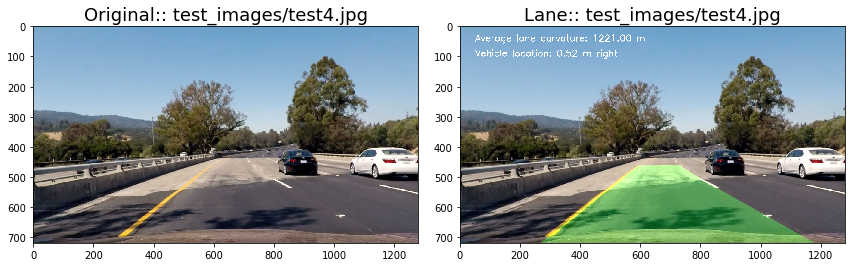

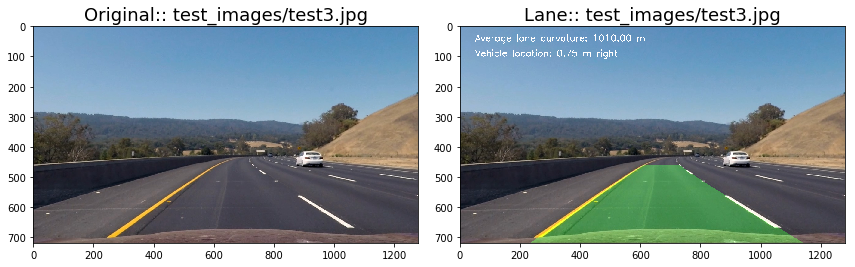

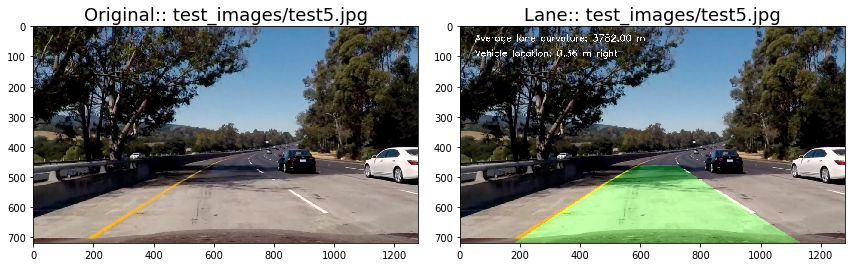

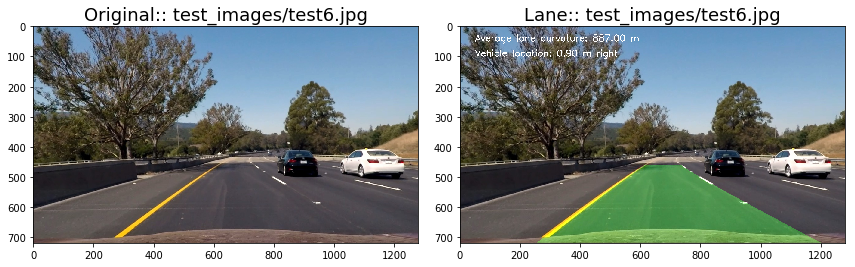

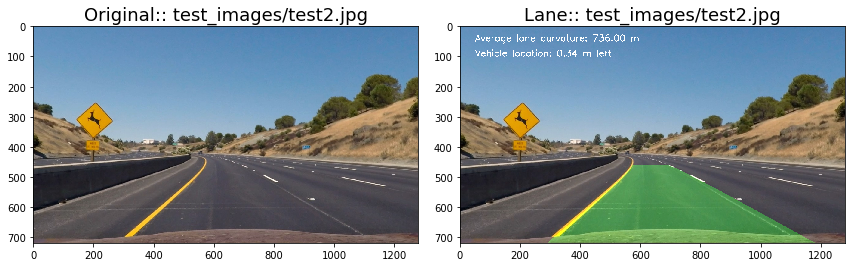

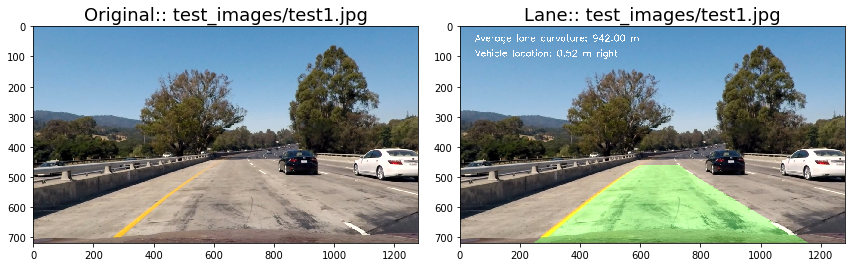

In [40]:
for image in images:    
    img = undistort(image, objpoints, imgpoints)
    
    combined_binary = get_bin_img(img, kernel_size=kernel_size, sobel_thresh=mag_thresh, r_thresh=r_thresh, 
                                  s_thresh=s_thresh, b_thresh = b_thresh, g_thresh=g_thresh)
    warped, warp_matrix, unwarp_matrix, out_img_orig, out_warped_img = transform_image(combined_binary)
    
    xmtr_per_pixel=3.7/800
    ymtr_per_pixel=30/720
    
    left_fit, right_fit, left_fitx, right_fitx, left_lane_indices, right_lane_indices, out_img = fit_polynomial(warped, nwindows=12, show=False)
    lane_img = draw_lines(img, left_fit, right_fit, minv)
    out_img = show_curvatures(lane_img, left_fit, right_fit, xmtr_per_pixel, ymtr_per_pixel)
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,8))
    f.tight_layout()
    ax1.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax1.set_title("Original:: " + image , fontsize=18)
    ax2.imshow(cv2.cvtColor(out_img, cv2.COLOR_BGR2RGB))
    ax2.set_title("Lane:: "+ image, fontsize=18)
    f.savefig(output_images + "/output_" + str(time.time()) + "_radius.jpg")

# Pipeline for video

In [41]:
class Lane():
    def __init__(self, max_counter):
        self.current_fit_left=None
        self.best_fit_left = None
        self.history_left = [np.array([False])] 
        self.current_fit_right=None
        self.best_fit_right = None
        self.history_right = [np.array([False])] 
        self.counter = 0
        self.max_counter = 1
        self.src = None
        self.dst = None
        
    def set_presp_points(self, src, dest):
        self.src = src
        self.dst = dst
        
    def reset(self):
        self.current_fit_left=None
        self.best_fit_left = None
        self.history_left =[np.array([False])] 
        self.current_fit_right = None
        self.best_fit_right = None
        self.history_right =[np.array([False])] 
        self.counter = 0
        
    def update_fit(self, left_fit, right_fit):
        if self.counter > self.max_counter:
            self.reset()
        else:
            self.current_fit_left = left_fit
            self.current_fit_right = right_fit
            self.history_left.append(left_fit)
            self.history_right.append(right_fit)
            self.history_left = self.history_left[-self.max_counter:] if len(self.history_left) > self.max_counter else self.history_left
            self.history_right = self.history_right[-self.max_counter:] if len(self.history_right) > self.max_counter else self.history_right
            self.best_fit_left = np.mean(self.history_left, axis=0)
            self.best_fit_right = np.mean(self.history_right, axis=0)
        
    def process_image(self, image):
        img = undistort_no_read(image, objpoints, imgpoints)
        
        combined_binary = get_bin_img(img, kernel_size=kernel_size, sobel_thresh=mag_thresh,
                                      r_thresh=r_thresh, s_thresh=s_thresh, b_thresh = b_thresh, g_thresh=g_thresh)
    
        if self.src is not None or self.dst is not None:
            warped, warp_matrix, unwarp_matrix, out_img_orig, out_warped_img = transform_image(combined_binary, src=self.src, dst= self.dst)
        else:
            warped, warp_matrix, unwarp_matrix, out_img_orig, out_warped_img = transform_image(combined_binary)
    
        xmtr_per_pixel=3.7/800
        ymtr_per_pixel=30/720
    
        if self.best_fit_left is None and self.best_fit_right is None:
            left_fit, right_fit, left_fitx, right_fitx, left_lane_indices, right_lane_indices, out_img = fit_polynomial(warped, nwindows=15, show=False)
        else:
            left_fit, right_fit, left_lane_indices, right_lane_indices= search_around_poly(warped, self.best_fit_left, self.best_fit_right, xmtr_per_pixel, ymtr_per_pixel)
            
        self.counter += 1
        
        lane_img = draw_lines(img, left_fit, right_fit, unwarp_matrix)
        out_img = show_curvatures(lane_img, left_fit, right_fit, xmtr_per_pixel, ymtr_per_pixel)
        
        self.update_fit(left_fit, right_fit)
        
        return out_img

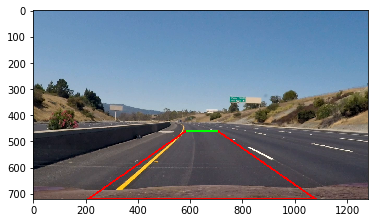

In [42]:
clip1 = VideoFileClip("project_video.mp4")
img = clip1.get_frame(0)

lefttop  = (585, 460)
righttop = (705, 460)
leftbottom  = (210, img.shape[0])
rightbottom = (1080, img.shape[0])
    
color_r = [255, 0, 0]
color_g = [0, 255, 0]
line_width = 5
    
src = np.float32([lefttop, leftbottom, righttop, rightbottom])

cv2.line(img, leftbottom, lefttop, color_r, line_width)
cv2.line(img, leftbottom, rightbottom, color_r , line_width * 2)
cv2.line(img, righttop, rightbottom, color_r, line_width)
cv2.line(img, righttop, lefttop, color_g, line_width)

plt.imshow(img)

In [43]:
lane1 = Lane(max_counter=5)

lefttop  = (585, 460)
righttop = (705, 460)
leftbottom  = (210, img.shape[0])
rightbottom = (1080, img.shape[0])
    
warped_lefttop = (250,0)
warped_righttop = (250, img.shape[0])
warped_leftbottom = (1050, 0)
warped_rightbottom = (1050, img.shape[0])

src = np.float32([lefttop, leftbottom, righttop, rightbottom])
dst = np.float32([warped_lefttop, warped_righttop, warped_leftbottom, warped_rightbottom])

lane1.set_presp_points(src, dst)

output = "test_videos_output/project.mp4"
# Create directory to save output video
create_dir("test_videos_output/")

clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(lane1.process_image)
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video test_videos_output/project.mp4
[MoviePy] Writing video test_videos_output/project.mp4


100%|█████████▉| 1260/1261 [32:40<00:01,  1.54s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project.mp4 

CPU times: user 30min 9s, sys: 13.2 s, total: 30min 22s
Wall time: 32min 43s


In [44]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))

In [45]:
lane1 = Lane(max_counter=5)

lefttop  = (585, 460)
righttop = (705, 460)
leftbottom  = (210, img.shape[0])
rightbottom = (1080, img.shape[0])
    
warped_lefttop = (250,0)
warped_righttop = (250, img.shape[0])
warped_leftbottom = (1050, 0)
warped_rightbottom = (1050, img.shape[0])

src = np.float32([lefttop, leftbottom, righttop, rightbottom])
dst = np.float32([warped_lefttop, warped_righttop, warped_leftbottom, warped_rightbottom])

lane1.set_presp_points(src, dst)

output = "test_videos_output/challenge_video.mp4"
# Create directory to save output video
create_dir("test_videos_output/")

clip1 = VideoFileClip("challenge_video.mp4")
white_clip = clip1.fl_image(lane1.process_image)
%time white_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video test_videos_output/challenge_video.mp4
[MoviePy] Writing video test_videos_output/challenge_video.mp4


100%|██████████| 485/485 [12:33<00:00,  1.55s/it]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/challenge_video.mp4 

CPU times: user 11min 34s, sys: 9.41 s, total: 11min 43s
Wall time: 12min 36s


In [46]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))